![qqq](../resources/header.jpg)

**Предварительная обработка и разведочный анализ данных**
***

О сайте **Letterboxd.com**:

"Letterboxd — это глобальная социальная сеть для массового обсуждения и открытия фильмов. Используйте его как дневник, чтобы записывать и делиться своим мнением о фильмах во время их просмотра или просто для отслеживания фильмов, которые вы смотрели в прошлом. Продемонстрируйте свои фавориты на странице своего профиля. Оценивайте, просматривайте и отмечайте фильмы по мере их добавления. Находите своих друзей и подписывайтесь на них, чтобы узнать, что им нравится. Ведите список фильмов, которые вы хотели бы посмотреть, и создавайте списки/коллекции по любой теме . Нас описывают как «что-то вроде "GoodReads для фильмов"." - с сайта **[Letterboxd.com](https://www.letterboxd.com)**.

**Методология сбора данных**: 

"Все метаданные, связанные с фильмами, используемые в Letterboxd, включая имена актеров, режиссеров и студий, краткие описания, даты выпуска, трейлеры и постеры, предоставляются The Movie Database (TMDb).
Letterboxd использует API TMDb, но не одобрен и не сертифицирован TMDb." - с сайта **[Letterboxd.com](https://www.letterboxd.com)**.

**Цель разведочного анализа данных**: провести анализ основных свойств данных, выявить распределения, общие зависимости и аномалии с помощью инструментов визуализации.

**Этапы разведочного анализа данных**:
1. [Обзор данных](#Обзор-данных).
2. [Предварительная обработка данных](#Предварительная-обработка-данных).
    - [Обработка названий полей](#Обработка-названий-полей);
    - [Проверка целостности связей между таблицами](#Проверка-целостности-связей-между-таблицами)
    - [Обработка явных дубликатов](#Обработка-явных-дубликатов);
    - [Обработка типов даных](#Обработка-типов-даных);
    - [Анализ пустых записей](#Анализ-пустых-записей);
    - [Поиск неявных дубликатов](#Поиск-неявных-дубликатов);
    - [Анализ изображений](#Анализ-изображений)
    - [Выводы по предварительной обработке данных](#Выводы-по-предварительной-обработке-данных).
3. [Разведочный анализ данных](#Разведочный-анализ-данных):
    - [Анализ даты выхода фильмов](#Анализ-даты-выхода-фильмов);
    - [Анализ числовых данных](#Анализ-числовых-данных):
        - [Анализ рейтинга фильмов](#Анализ-рейтинга-фильмов).
    - [Анализ категориальных данных](#Анализ-категориальных-данных):
        - [Жанры фильмов](#Жанры-фильмов);
        - [Киностудии](#Киностудии).
    - [Американская киноассоциация](#Американская-киноассоциация)
3. [Выводы](#Выводы)
***

In [1]:
import sys

In [2]:
sys.path.append('C:\Projects\Letterboxd')

In [3]:
import os

import matplotlib.cbook as cbook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib.gridspec import GridSpec

from src.config.paths import PATH_RAW_DATA
from src.utils.explorer import explorer
from src.utils import plot

C:\Users\gsimo\AppData\Local\Temp\ipykernel_15188\3073136387.py:6: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [4]:
sns.set_style('white')

In [5]:
print(explorer(PATH_RAW_DATA, exclude=('checkpoints', )))

1. Letterboxd.


In [6]:
folder = 'Letterboxd'

In [7]:
print(explorer(f'{PATH_RAW_DATA}/{folder}', '*.csv'))

1. actors.csv.
2. countries.csv.
3. crew.csv.
4. genres.csv.
5. languages.csv.
6. movies.csv.
7. posters.csv.
8. releases.csv.
9. studios.csv.
10. themes.csv.


In [8]:
FILE_PATH = {
    'actors': f'{PATH_RAW_DATA}/{folder}/actors.csv',
    'countries': f'{PATH_RAW_DATA}/{folder}/countries.csv',
    'crew': f'{PATH_RAW_DATA}/{folder}/crew.csv',
    'genres': f'{PATH_RAW_DATA}/{folder}/genres.csv',
    'languages': f'{PATH_RAW_DATA}/{folder}/languages.csv',
    'movies': f'{PATH_RAW_DATA}/{folder}/movies.csv',
    'releases': f'{PATH_RAW_DATA}/{folder}/releases.csv',
    'studios': f'{PATH_RAW_DATA}/{folder}/studios.csv',
    'themes': f'{PATH_RAW_DATA}/{folder}/themes.csv',
}

# Обзор данных
***

In [9]:
df = {file: pd.read_csv(path) for file, path in FILE_PATH.items()}

In [10]:
df['movies'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 941597 entries, 0 to 941596
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   id           941597 non-null  int64  
 1   name         941587 non-null  object 
 2   date         849684 non-null  float64
 3   tagline      139387 non-null  object 
 4   description  780785 non-null  object 
 5   minute       760027 non-null  float64
 6   rating       90999 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 424.5 MB


In [11]:
pd.concat([
    df['movies'].head(),
    df['movies'].sample(5),
    df['movies'].tail()
])

,id,name,date,tagline,description,minute,rating
0,1000001,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86
1,1000002,Parasite,2019.0,Act like you own the place.,"All unemployed, Ki-taek's family takes peculia...",133.0,4.56
2,1000003,Everything Everywhere All at Once,2022.0,The universe is so much bigger than you realize.,An aging Chinese immigrant is swept up in an i...,140.0,4.30
3,1000004,Fight Club,1999.0,Mischief. Mayhem. Soap.,A ticking-time-bomb insomniac and a slippery s...,139.0,4.27
4,1000005,La La Land,2016.0,Here's to the fools who dream.,"Mia, an aspiring actress, serves lattes to mov...",129.0,4.09
834937,1834938,La chasse aux grenouilles de la rue Wemotaci,2023.0,NaN,NaN,4.0,NaN
8907,1008908,The Mutilator,1984.0,"By pick, by axe, by sword, bye bye!","As a child, Ed was cleaning his father’s hunti...",86.0,2.76
823892,1823893,Ett hus i min famn,1973.0,NaN,Documentary about the Swedish artist Anders Åb...,37.0,NaN
113622,1113623,Wagner & Me,2010.0,NaN,Actor and writer Stephen Fry explores his pass...,89.0,NaN
791613,1791614,Sigma Sound: The Sound Heard 'Round the World,2023.0,NaN,"In the 1960s, while America was in the throes ...",82.0,NaN


In [12]:
df['actors'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5798450 entries, 0 to 5798449
Data columns (total 3 columns):
 #   Column  Dtype 
---  ------  ----- 
 0   id      int64 
 1   name    object
 2   role    object
dtypes: int64(1), object(2)
memory usage: 791.3 MB


In [13]:
pd.concat([
    df['actors'].head(),
    df['actors'].sample(5),
    df['actors'].tail()
])

,id,name,role
0,1000001,Margot Robbie,Barbie
1,1000001,Ryan Gosling,Ken
2,1000001,America Ferrera,Gloria
3,1000001,Ariana Greenblatt,Sasha
4,1000001,Issa Rae,Barbie
4417351,1497449,Carleton Young,NaN
4831391,1593397,Mabel Bardine,Eugenia Moore
553627,1019161,Daniel Lee,Doghouse Boy #3
5085808,1662907,Lajos Boray,NaN
3205448,1280579,Aldo Baglio,Self


In [14]:
df['crew'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4720183 entries, 0 to 4720182
Data columns (total 3 columns):
 #   Column  Dtype 
---  ------  ----- 
 0   id      int64 
 1   role    object
 2   name    object
dtypes: int64(1), object(2)
memory usage: 667.5 MB


In [15]:
pd.concat([
    df['crew'].head(),
    df['crew'].sample(5),
    df['crew'].tail()
])

,id,role,name
0,1000001,Director,Greta Gerwig
1,1000001,Producer,Tom Ackerley
2,1000001,Producer,Margot Robbie
3,1000001,Producer,Robbie Brenner
4,1000001,Producer,David Heyman
2606381,1279433,Director,Sasha Moric
2415482,1241468,Producer,Renat Davletyarov
2674099,1293693,Editor,Lena Paersch
1452055,1094406,Composer,Dimitri Smith
4022227,1654954,Director,Ben Van Meter


In [16]:
df['languages'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1038762 entries, 0 to 1038761
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype 
---  ------    --------------    ----- 
 0   id        1038762 non-null  int64 
 1   type      1038762 non-null  object
 2   language  1038762 non-null  object
dtypes: int64(1), object(2)
memory usage: 137.6 MB


In [17]:
pd.concat([
    df['languages'].head(),
    df['languages'].sample(5),
    df['languages'].tail()
])

,id,type,language
0,1000001,Language,English
1,1000002,Primary language,Korean
2,1000002,Spoken language,English
3,1000002,Spoken language,German
4,1000002,Spoken language,Korean
838076,1746356,Spoken language,No spoken language
614479,1532055,Spoken language,English
453348,1380500,Language,Turkish
897365,1803573,Language,English
20225,1011403,Language,English


In [18]:
df['studios'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679283 entries, 0 to 679282
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      679283 non-null  int64 
 1   studio  679273 non-null  object
dtypes: int64(1), object(1)
memory usage: 54.6 MB


In [19]:
pd.concat([
    df['studios'].head(),
    df['studios'].sample(5),
    df['studios'].tail()
])

,id,studio
0,1000001,LuckyChap Entertainment
1,1000001,Heyday Films
2,1000001,NB/GG Pictures
3,1000001,Mattel
4,1000001,Warner Bros. Pictures
600866,1715976,Shapla Media
46401,1015317,Somewhere Pictures
216202,1120012,Mahakarya Pictures
69756,1025004,Guber/Peters Company
176234,1088274,Hand Made Films


In [20]:
df['countries'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693476 entries, 0 to 693475
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   id       693476 non-null  int64 
 1   country  693476 non-null  object
dtypes: int64(1), object(1)
memory usage: 46.8 MB


In [21]:
pd.concat([
    df['countries'].head(),
    df['countries'].sample(5),
    df['countries'].tail()
])

,id,country
0,1000001,UK
1,1000001,USA
2,1000002,South Korea
3,1000003,USA
4,1000004,Germany
226196,1204392,UK
599186,1743741,Germany
21354,1014577,USA
424587,1460072,UK
20022,1013609,USA


In [22]:
df['genres'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1046849 entries, 0 to 1046848
Data columns (total 2 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   id      1046849 non-null  int64 
 1   genre   1046849 non-null  object
dtypes: int64(1), object(1)
memory usage: 72.0 MB


In [23]:
pd.concat([
    df['genres'].head(),
    df['genres'].sample(5),
    df['genres'].tail()
])

,id,genre
0,1000001,Comedy
1,1000001,Adventure
2,1000002,Comedy
3,1000002,Thriller
4,1000002,Drama
936395,1766786,Thriller
657488,1456610,Drama
652010,1451280,Animation
642164,1441824,Drama
483824,1302804,Family


In [24]:
df['themes'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125641 entries, 0 to 125640
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      125641 non-null  int64 
 1   theme   125641 non-null  object
dtypes: int64(1), object(1)
memory usage: 11.8 MB


In [25]:
pd.concat([
    df['themes'].head(),
    df['themes'].sample(5),
    df['themes'].tail()
])

,id,theme
0,1000001,Humanity and the world around us
1,1000001,Crude humor and satire
2,1000001,Moving relationship stories
3,1000001,Emotional and captivating fantasy storytelling
4,1000001,Surreal and thought-provoking visions of life ...
43935,1007911,Action comedy and silly heroics
7212,1001085,Twisted dark psychological thriller
47397,1008773,"Gory, gruesome, and slasher horror"
90133,1025545,"Creepy, chilling, and terrifying horror"
123546,1122250,Intense violence and sexual transgression


In [26]:
df['releases'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1332782 entries, 0 to 1332781
Data columns (total 5 columns):
 #   Column   Non-Null Count    Dtype 
---  ------   --------------    ----- 
 0   id       1332782 non-null  int64 
 1   country  1332782 non-null  object
 2   date     1332782 non-null  object
 3   type     1332782 non-null  object
 4   rating   333980 non-null   object
dtypes: int64(1), object(4)
memory usage: 308.5 MB


In [27]:
pd.concat([
    df['releases'].head(),
    df['releases'].sample(5),
    df['releases'].tail()
])

,id,country,date,type,rating
0,1000001,Andorra,2023-07-21,Theatrical,NaN
1,1000001,Argentina,2023-07-20,Theatrical,ATP
2,1000001,Australia,2023-07-19,Theatrical,PG
3,1000001,Australia,2023-10-01,Digital,PG
4,1000001,Austria,2023-07-20,Theatrical,NaN
1047801,1593032,Japan,1972-05-07,Theatrical,NaN
14848,1000216,Turkey,2008-03-21,Theatrical,NaN
1168177,1723700,Belgium,1997-01-01,Theatrical,NaN
507126,1112096,South Korea,2019-05-24,Premiere,NaN
196104,1007819,Sweden,2015-05-22,Theatrical,NaN


In [28]:
directory = f'{PATH_RAW_DATA}/{folder}/posters'

In [29]:
files = os.listdir(directory)

In [30]:
posters = pd.Series(files)

In [31]:
posters

0         1000001.jpg
1         1000002.jpg
2         1000003.jpg
3         1000004.jpg
4         1000005.jpg
             ...     
760880    1941586.jpg
760881    1941589.jpg
760882    1941592.jpg
760883    1941595.jpg
760884    1941596.jpg
Length: 760885, dtype: object

# Предварительная обработка данных
***

## Обработка названий полей
***

In [32]:
for name, data in df.items():
    print(f'{name:9} {", ".join(data.columns.tolist())}')

actors    id, name, role
countries id, country
crew      id, role, name
genres    id, genre
languages id, type, language
movies    id, name, date, tagline, description, minute, rating
releases  id, country, date, type, rating
studios   id, studio
themes    id, theme


Оставим названия полей **без изменений**.

## Проверка целостности связей между таблицами

In [33]:
table = pd.DataFrame(
    index=[name for name in df if name != 'movies'],
    columns=['Нет первичных ключей', 'Нет внешних ключей']
)

movies = set(df['movies']['id'])

for name, data in df.items():
    if name != 'movies':
        ids = set(data['id'])
    
        table.loc[name, 'Нет первичных ключей'] = len(ids - movies)
        table.loc[name, 'Нет внешних ключей'] = len(movies - ids)

table

,Нет первичных ключей,Нет внешних ключей
actors,0,307295
countries,0,324405
crew,0,134535
genres,0,265106
languages,0,36019
releases,0,115579
studios,0,503400
themes,0,917089


**Примечание**:
1. **Нет первичных ключей**: ключи (id) присутвтуют в дополнительных файлах, но при этом, отсутствуют в основном файле (movies.csv), что не позволяет идентифицировать данные (например, определить, к какому фильму принадлежать актеры или жанры).
2. **Нет внешних ключей**: ключи (id) присутвтуют в основном файле (movies.csv), но при этом, отсутствуют в дополнительных файлах (у фильма отсутствуют данные об актерах, жанрах и тд.)

## Обработка явных дубликатов
***

In [34]:
table = pd.DataFrame(
    data={
        'Количество': [data.duplicated().sum() for data in df.values()],
        'Проценты': [data.duplicated().sum() / data.shape[0] for data in df.values()],
    },
    index=[data for data in df]
)
table.loc['Всего', :] = [table['Количество'].sum(),  
                         table['Количество'].sum() / 
                         sum([data.shape[0] for data in df.values()])]
table = table.astype({'Количество': 'int32'})
(table
 .style
 .format({'Проценты': lambda x: f'{x:.2%}'}))

,Количество,Проценты
actors,946,0.02%
countries,0,0.00%
crew,1282,0.03%
genres,0,0.00%
languages,0,0.00%
movies,0,0.00%
releases,0,0.00%
studios,212,0.03%
themes,0,0.00%
Всего,2440,0.01%


## Обработка типов данных
***

In [35]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поля']
)
values = [value for data in df.values() for value in data.dtypes.values]
pd.DataFrame(
    data=values,
    index=index,
    columns=['Типы данных']
).style

Изменим типы данных:
- для поля **date** в наборах **movie** и **releases** изменим тип данных на **datetime**;
- для **числовых полей**, уменьшим точность до **32 бит**.

In [36]:
df['movies']['date'] = pd.to_datetime(df['movies']['date'], format='%Y')
df['releases']['date'] = pd.to_datetime(df['releases']['date'], format='%Y-%m-%d')

In [37]:
df['movies'] = df['movies'].astype({
    'minute': 'float32',
    'rating': 'float32',
})

In [38]:
for name in df:
    df[name] = df[name].astype({'id': 'int32'})

In [39]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поля']
)
values = [value for data in df.values() for value in data.dtypes.values]
pd.DataFrame(
    data=values,
    index=index,
    columns=['Типы данных']
).style

## Анализ пустых записей
***

In [40]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поле']
)
values = {
    'Количество': [value for data in df.values() for value in data.isna().sum().values],
    'Проценты': [value / data.shape[0] for data in df.values() for value in data.isna().sum().values],
}
(pd.DataFrame(
    data=values,
    index=index,
).style
 .format({'Проценты': lambda x: f'{x:.2%}'}))

## Поиск неявных дубликатов
***

In [41]:
df['movies'][df['movies'].columns[1:]].duplicated().sum()

4066

In [42]:
df['movies'][df['movies'][df['movies'].columns[1:]].duplicated(keep=False)].sort_values(by='name')

,id,name,date,tagline,description,minute,rating
812528,1812529,"""Born""",2023-01-01,NaN,Two teenagers sat and complained about coming ...,34.0,NaN
812712,1812713,"""Born""",2023-01-01,NaN,Two teenagers sat and complained about coming ...,34.0,NaN
603457,1603458,"""O Jehovah, . . . I Trust in You""",2016-01-01,"O Jehovah, . . . I Trust in You",See how Hezekiah overcomes pressure from all s...,52.0,NaN
755047,1755048,"""O Jehovah, . . . I Trust in You""",2016-01-01,"O Jehovah, . . . I Trust in You",See how Hezekiah overcomes pressure from all s...,52.0,NaN
676092,1676093,#Eindejaars2,2020-01-01,NaN,The hilarious end-of-year show by Bert Gabriël...,88.0,NaN
...,...,...,...,...,...,...,...
648185,1648186,NaN,NaT,NaN,NaN,NaN,NaN
725369,1725370,NaN,NaT,NaN,NaN,NaN,NaN
840337,1840338,NaN,NaT,NaN,NaN,NaN,NaN
883228,1883229,NaN,NaT,NaN,NaN,NaN,NaN


In [43]:
ids = df['movies'][df['movies'][df['movies'].columns[1:]].duplicated()]['id']

In [44]:
for name in df:
    df[name] = df[name][~df[name]['id'].isin(ids)]

In [45]:
df['movies'][df['movies'].columns[1:]].duplicated().sum()

0

## Анализ изображений

In [46]:
images = set(posters.apply(lambda x: int(x.split('.')[0])).values)

In [47]:
ids = set(df['movies']['id'].values)

In [48]:
print(f'Постеры без информации о фильме: {len(images - ids)}')

Постеры без информации о фильме: 1675


In [49]:
print(f'Фильмы без постеров: {len(ids - images)}')

Фильмы без постеров: 178321


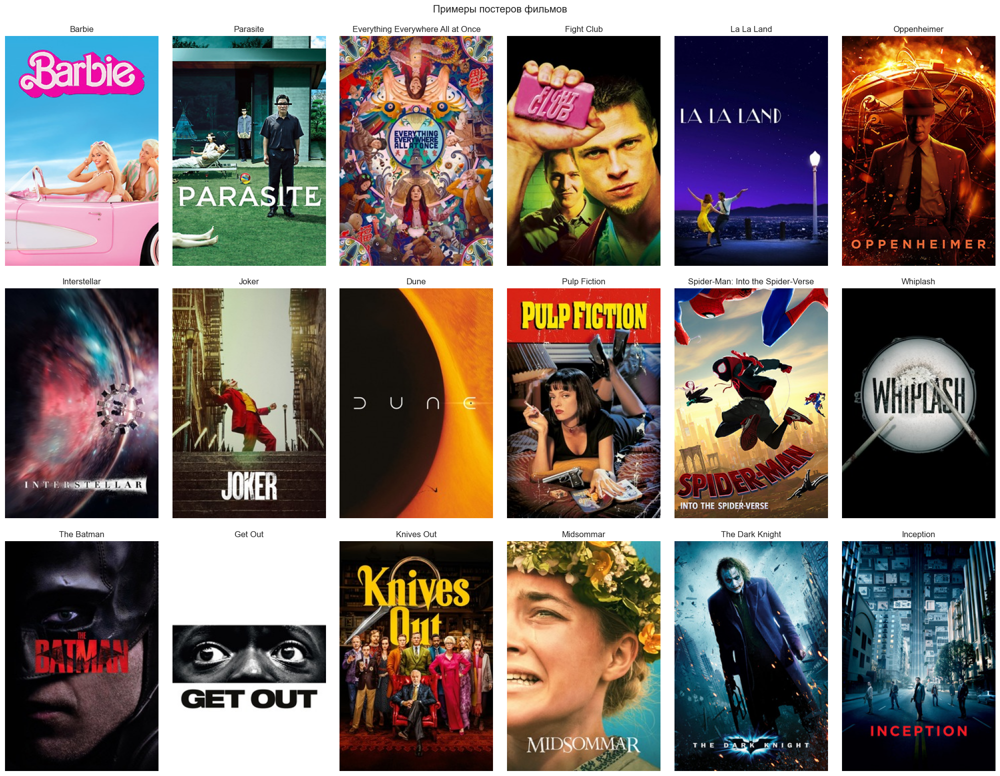

In [50]:
figure = plt.figure(
    layout='constrained',
    figsize=(20, 15)
)

grid = GridSpec(
    figure=figure,
    nrows=3,
    ncols=6,
    hspace=0.05,
    wspace=0.05,
)

figure.suptitle(
    t='Примеры постеров фильмов',
    y=1.025,
    fontsize='x-large'
)

for i in range(3):
    for j in range(6):
        figure.add_subplot(grid[i, j])

data = posters.head(18)

for i, path in enumerate(data):
    key = int(path.split('.')[0])
    name = df['movies'].loc[df['movies']['id'] == key, 'name'].iloc[0]
    
    figure.axes[i].set_title(
        label=name,
        fontsize='large',
        y=1.0
    )
    
    with cbook.get_sample_data(f'{PATH_RAW_DATA}/{folder}/posters/{path}') as file:
        image = plt.imread(file)
        figure.axes[i].imshow(image)
        
for i in range(18):
    figure.axes[i].set_xticks([])
    figure.axes[i].set_yticks([])
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

## Выводы по предварительной обработке данных

1. Названия полей оставлены **без изменений**.
2. Измены типы данных:
    - для поля **date** в наборах **movie** и **releases** изменен тип данных на **datetime**;
    - для **числовых полей**, уменьшена точность до **32 бит**.
3. Удалено до **5000** явных дубликатов. 

# Разведочный анализ данных
***

## Анализ даты выхода фильмов

In [51]:
def line(data: pd.DataFrame, x: str, y: str, title: str, xlabel: str, ylabel: str):
    figure = plt.figure(
        layout="constrained",
        figsize=(20, 5)
    )
    
    figure.suptitle(
        t=title, 
        y=1.05, 
        fontsize='x-large'
    )
    
    figure.add_subplot()
    
    sns.lineplot(
        data=data,
        x=x,
        y=y,
        linewidth=2.0,
        marker='o',
        markersize=8,
        ax=figure.axes[0],
        color=sns.color_palette('hls', 15)[8]
    )
    
    figure.axes[0].set_xlabel(xlabel)
    figure.axes[0].set_ylabel(ylabel)
    figure.axes[0].set_xticks(
        ticks=data[x], 
        labels=data[x].map(str),
        rotation=65
    );
    s, maximum = plot.step(data[y].max())
    figure.axes[0].set_yticks(np.arange(0, maximum + 1, s))
    figure.axes[0].set_xbound(
        lower=data[x].min() - 0.5, 
        upper=data[x].max() + 0.5
    )
    
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[0].spines[s].set_visible(False)

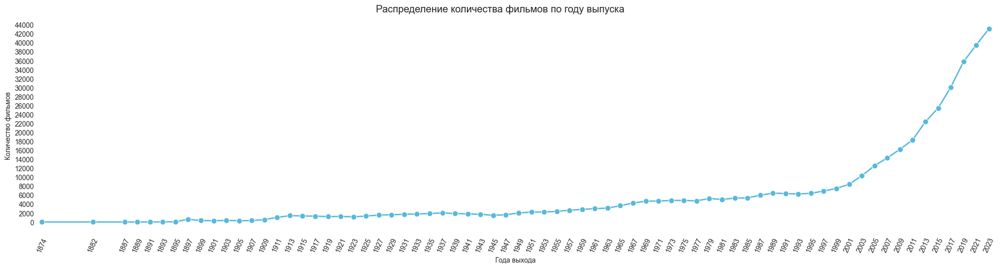

In [52]:
plot_data = df['movies'][df['movies']['date'].dt.year < 2024]
plot_data = (plot_data['date']
             .dt
             .year
             .astype('int32')
             .value_counts()
             .reset_index()
             .sort_values(by='date'))

plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])

line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение количества фильмов '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Количество фильмов'
)

**Первый фильм** выпущен в **1874** году. **Резкий подъем** количества выпущенных фильмов начинается в **2000** году и достигает свого **пика** в **2021** году (приблизительно **38 тыс.** фильмов).

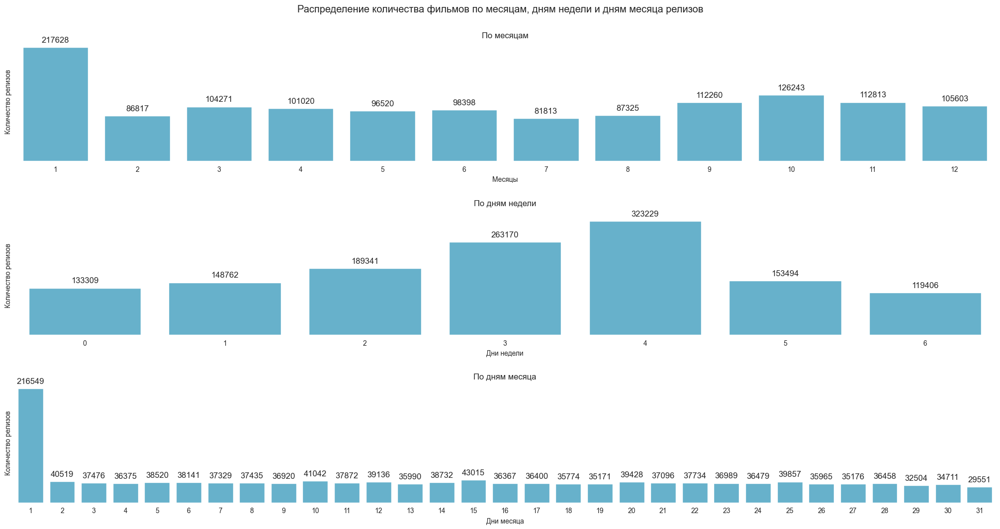

In [53]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 10)
)

figure.suptitle(
    t=('Распределение количества фильмов '
       'по месяцам, дням недели и дням месяца релизов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=3, 
    ncols=1, 
    hspace=0.1
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[1, 0])
figure.add_subplot(grid[2, 0])

plot_data = (df['releases']['date']
             .dt.month
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count', 
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_title(
    label='По месяцам',
    y=1,
    fontsize='large'
)
figure.axes[0].set_xlabel('Месяцы')
figure.axes[0].set_ylabel('Количество релизов')
figure.axes[0].set_yticks([])
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
)

plot_data = (df['releases']['date']
             .dt.weekday
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count',
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[1].set_title(
    label='По дням недели',
    y=1.05,
    fontsize='large'
)
figure.axes[1].set_xlabel('Дни недели')
figure.axes[1].set_ylabel('Количество релизов')
figure.axes[1].set_yticks([])
figure.axes[1].bar_label(
    container=figure.axes[1].containers[0], 
    fontsize=12, 
    padding=5
)

plot_data = (df['releases']['date']
             .dt.day
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count',
    ax=figure.axes[2], 
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[2].set_title(
    label='По дням месяца',
    y=1,
    fontsize='large'
)
figure.axes[2].set_xlabel('Дни месяца')
figure.axes[2].set_ylabel('Количество релизов')
figure.axes[2].set_yticks([])
figure.axes[2].bar_label(
    container=figure.axes[2].containers[0], 
    fontsize=12, 
    padding=5
)

for ax in range(3):
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[ax].spines[s].set_visible(False)

Наибольшее количество релизов проходит в **Январе**, **1 числа**, в **пятницу**.

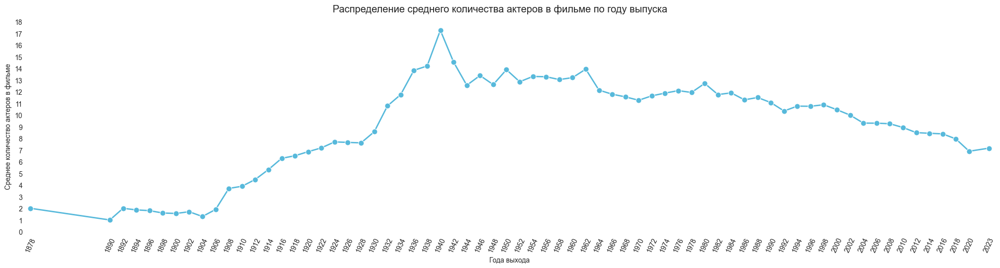

In [54]:
plot_data = df['actors'].join(df['movies'].set_index('id'), on='id', rsuffix='+')
plot_data = plot_data.loc[plot_data['date'].dt.year < 2024, ['id', 'date']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = (plot_data
             .groupby(['date', 'id'])
             .value_counts()
             .groupby('date')
             .mean()
             .reset_index()
             .sort_values(by='date'))
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])
line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение среднего количества актеров в фильме '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Среднее количество актеров в фильме'
)

Среднее количество актеров, снимавшихся в фильме достигло своего пика в **1940** году (более **15** актеров). С этого года среднее количество актеров, снимавшихся в фильме **снижается**. В **2023** году их количество составляет **менее 10**.

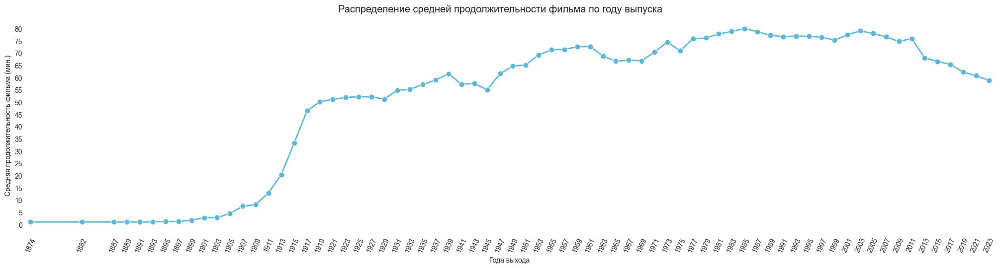

In [55]:
plot_data = df['movies'].loc[df['movies']['date'].dt.year < 2024, ['date', 'minute']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = plot_data.groupby('date').mean().reset_index()
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])

line(
    data=plot_data,
    x='date',
    y='minute',
    title=('Распределение средней продолжительности фильма '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Средняя продолжительность фильма (мин.)'
)

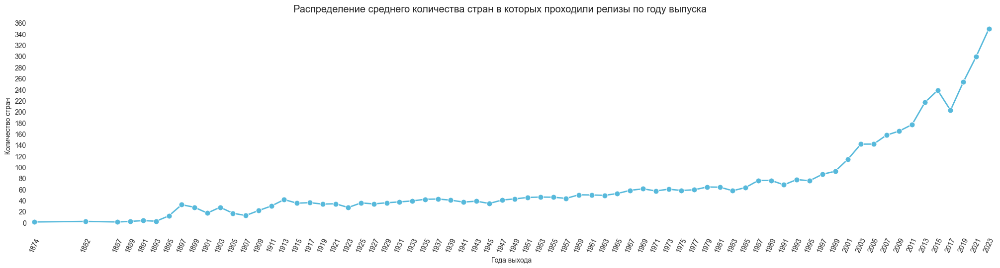

In [56]:
plot_data = df['releases'].join(df['movies'].set_index('id'), on='id', rsuffix='+')
plot_data = plot_data.loc[plot_data['date'].dt.year < 2024, ['country', 'date']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = (plot_data
             .groupby(['date', 'country'])
             .value_counts()
             .groupby('date')
             .mean()
             .reset_index()
             .sort_values(by='date'))
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])
line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение среднего количества стран '
           'в которых проходили релизы '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Количество стран'
)

In [57]:
def matrix(data: pd.DataFrame, title: str, xlabel: str, ylabel: str, width: float):
    figure = plt.figure(
        layout="constrained",
        figsize=(20, width)
    )

    figure.suptitle(
        t=title, 
        y=1.05, 
        fontsize='x-large'
    )
    
    grid = GridSpec(
        figure=figure,
        nrows=1, 
        ncols=2, 
        wspace=0.01,
        width_ratios=[1, 0.025]
    )
    
    figure.add_subplot(grid[0, 0])
    figure.add_subplot(grid[0, 1])
    
    s, maximum = plot.step(plot_data.max().max())
    
    sns.heatmap(
        data=data,
        linewidths=1.0,
        cmap=sns.color_palette("light:#57b9db", as_cmap=True),
        ax=figure.axes[0],
        cbar_ax=figure.axes[1],
        annot=True,
        fmt='d',
        mask=data == 0,
        cbar_kws={'ticklocation': 'left'},
        vmin=0,
        vmax=maximum
    )
    
    
    figure.axes[1].set_yticks(np.arange(0, maximum + 1, s))
    figure.axes[0].set_xlabel(xlabel)
    figure.axes[0].set_ylabel(ylabel)
    figure.axes[0].tick_params(axis='x', labelrotation=45.0)

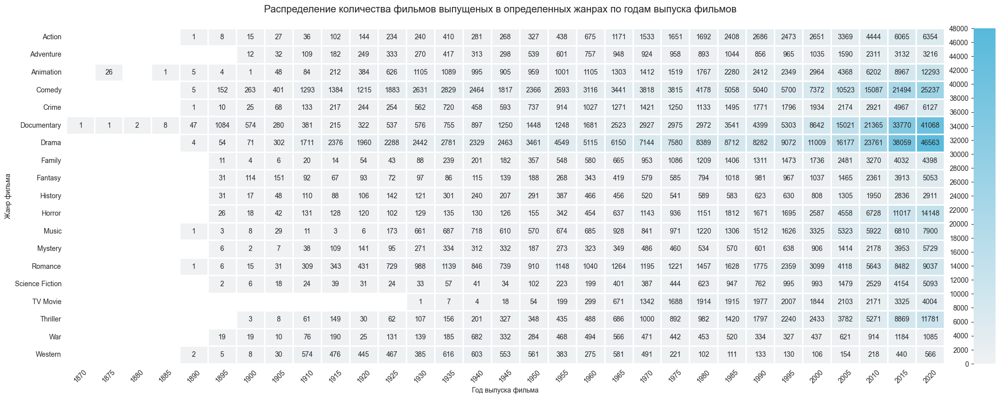

In [58]:
plot_data = (df['genres']
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data = (plot_data
             .groupby('date')['genre']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)

matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'выпущеных в определенных жанрах '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Жанр фильма',
    width=7.5
)

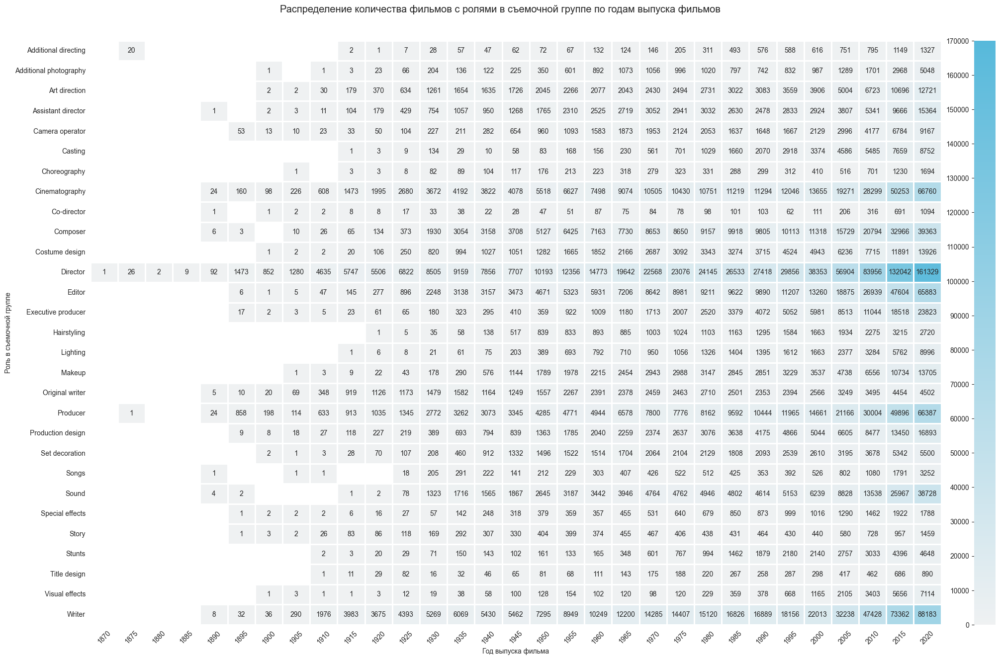

In [59]:
plot_data = (df['crew'][['id', 'role']]
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data = (plot_data
             .drop_duplicates()
             .groupby('date')['role']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)

matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'с ролями в съемочной группе '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Роль в съемочной группе',
    width=12.5
)

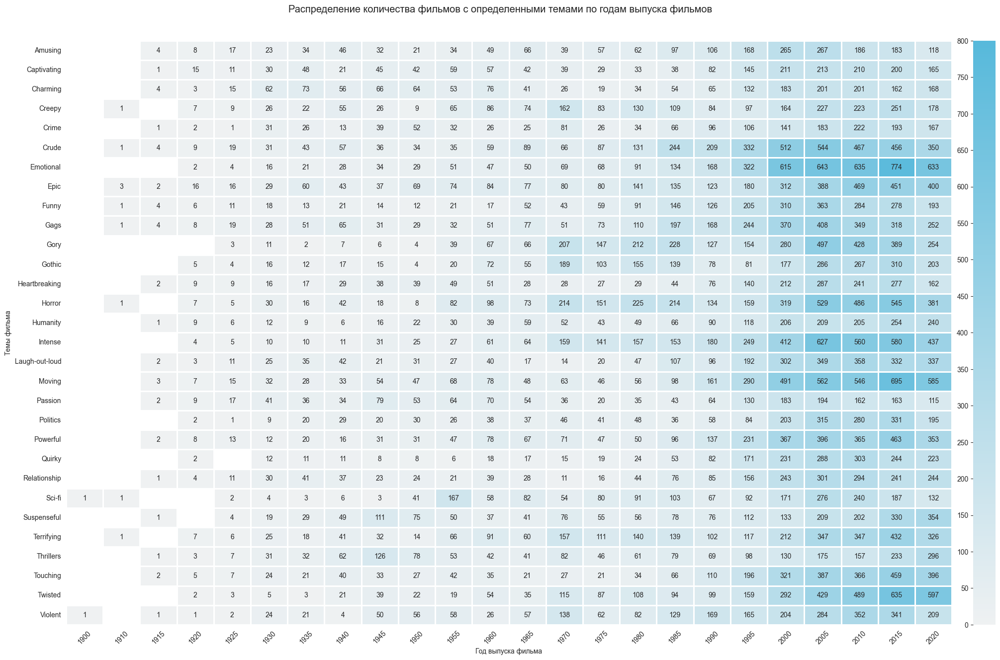

In [60]:
plot_data = (df['themes']
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data['theme'] = plot_data['theme'].apply(lambda x: (x
                                                         .replace(',', '')
                                                         .split()[0]))
plot_data = plot_data[plot_data['theme'].isin(plot_data['theme'].value_counts().index[:30])]
plot_data = (plot_data
             .groupby('date')['theme']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)
matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'с определенными темами '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Темы фильма',
    width=12.5
)

## Анализ числовых данных

In [61]:
(df['movies'][['minute', 'rating']]
 .describe(percentiles=np.linspace(0.1, 0.9, 9))
 .style
 .format(lambda x: f'{x:.2f}'))

,minute,rating
count,758441.00,90980.00
mean,65.80,3.24
std,154.96,0.42
min,1.00,0.88
10%,6.00,2.70
20%,11.00,2.93
30%,19.00,3.09
40%,40.00,3.21
50%,62.00,3.30
60%,80.00,3.38


In [62]:
df['movies'][df['movies']['minute'] > 200].sort_values(by='minute', ascending=False)

,id,name,date,tagline,description,minute,rating
193178,1193179,Al Zeer Salem,2000-01-01,NaN,A historical series embodying the character of...,72000.0,NaN
451305,1451306,Eighteen Springs,2002-01-01,NaN,Eighteen Springs (also known as Affair of Half...,58800.0,NaN
27643,1027644,Logistics,2011-01-01,NaN,Logistics or Logistics Art Project is an exper...,51420.0,3.28
94545,1094546,Modern Times Forever,2011-01-01,NaN,"The film shows centuries of decay, compressed ...",14400.0,NaN
321049,1321050,Svalbard minutt for minutt,2020-01-01,NaN,A documentary trying to relive the 10 days of ...,13319.0,NaN
...,...,...,...,...,...,...,...
872801,1872802,Wagner- Tannhauser Uria Monzon,NaT,NaN,NaN,201.0,NaN
890246,1890247,Lord of the Decks 3,2005-01-01,NaN,CD/DVD combo highlighting Grime Hiphop from th...,201.0,NaN
502292,1502293,Scarlet Straps,1979-01-01,NaN,A story of a young cadets of Suvorovsky army s...,201.0,NaN
898515,1898516,Murahiq Fi AlKhamseen,NaT,NaN,"The story of Abdel Bary, a successful doctor a...",201.0,NaN


"**Логистика** или **Логистический арт-проект** — экспериментальный художественный фильм, продолжительностью 51 420 минут (857 часов или 35 дней и 17 часов). Это самый длинный фильм, когда-либо созданный. 37-дневное роуд-муви в прямом смысле этого слова. Работа посвящена Времени и Потреблению. Это выдвигает на передний план то, о чем часто забывают в нашем цифровом, якобы быстро меняющемся мире: медленные физические грузовые перевозки, которые лежат в основе нашей экономической реальности." - с сайта **[Letterboxd.com](https://letterboxd.com/film/logistics-2011)**.

Удалим данные о фиьмах, продолжительность которых более **200** минут.

In [63]:
ids = df['movies'].loc[df['movies']['minute'] > 200, 'id']

In [64]:
for name in df:
    df[name] = df[name][~df[name]['id'].isin(ids)]

In [65]:
(df['movies'][['minute', 'rating']]
 .describe(percentiles=np.linspace(0.1, 0.9, 9))
 .style
 .format(lambda x: f'{x:.2f}'))

,minute,rating
count,746392.00,88313.00
mean,58.13,3.23
std,42.53,0.41
min,1.00,0.88
10%,6.00,2.69
20%,11.00,2.92
30%,18.00,3.08
40%,38.00,3.20
50%,60.00,3.29
60%,80.00,3.37


Более **90%** фильмов имеют продолжительность менее **115 минут** и рейтинг менее **3.7**.

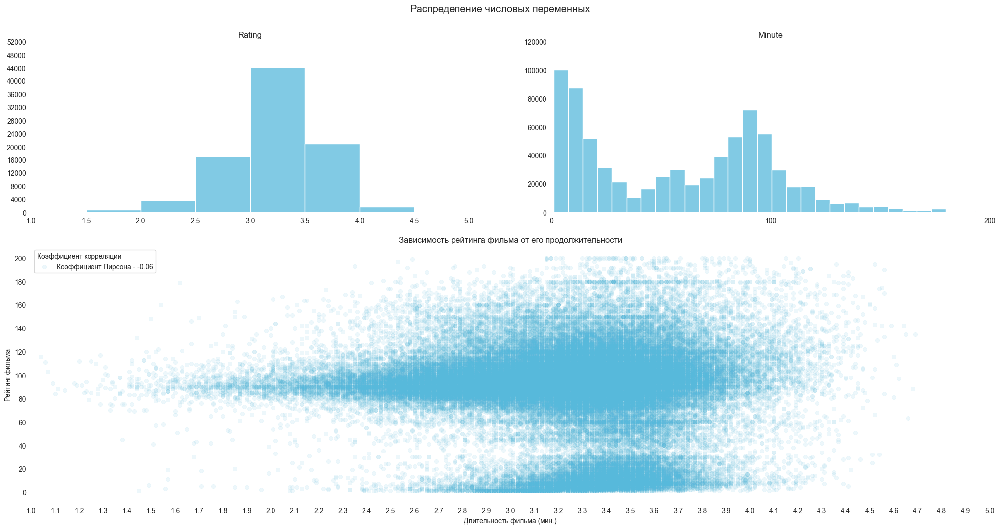

In [66]:
figure = plt.figure(
    layout="constrained", 
    figsize=(20, 10)
)

figure.suptitle(
    t='Распределение числовых переменных',
    y=1.05,
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure, 
    nrows=2, 
    ncols=2,  
    wspace=0.05,
    hspace=0.05,
    height_ratios=[1, 1.5]
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])
figure.add_subplot(grid[1, :])

columns = ['rating', 'minute']

for i, column in enumerate(columns):
    bins = np.linspace(1.0, 5.0, 9) if not i else 30
    
    sns.histplot(
        x=df['movies'][column], 
        ax=figure.axes[i], 
        bins=bins,
        color=sns.color_palette('hls', 15)[8]
    )
        
    figure.axes[i].set_title(
        label=column.capitalize(),
        y=1,
        fontsize='large'
    )
    figure.axes[i].set_xlabel('')
    figure.axes[i].set_ylabel('')
    s, maximum = plot.step(figure.axes[i].get_yticks().max() - 1, 2)
    figure.axes[i].set_yticks(np.arange(0, maximum + 1, s))
    if i:
        figure.axes[i].set_xticks(np.arange(0, 201, 100))
        figure.axes[i].set_xbound(0, 200)
    else:
        figure.axes[0].set_xbound((1.0, 5.0))

sns.scatterplot(
    data=df['movies'][['rating', 'minute']],
    x='rating',
    y='minute',
    alpha=0.10,
    sizes=8,
    edgecolors=None,
    ax=figure.axes[2],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[2].set_title(
    label='Зависимость рейтинга фильма от его продолжительности',
    y=1,
    fontsize='large'
)

figure.axes[2].set_xticks(np.linspace(1.0, 5.0, 41))
figure.axes[2].set_xbound((1.0, 5.0))
s, maximum = plot.step(df['movies']['minute'].max() - 1, 2)
figure.axes[2].set_yticks(np.arange(0, maximum + 1, s))
figure.axes[2].set_xlabel('Длительность фильма (мин.)')
figure.axes[2].set_ylabel('Рейтинг фильма')

pirson = df['movies']['rating'].corr(df['movies']['minute'])
figure.axes[2].legend(
    title='Коэффициент корреляции',
    labels=[f'Коэффициент Пирсона - {pirson:.2f}'],
    loc='upper left', 
    alignment='left'
)

for i in range(3):
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

Между рейтингом и продолжительностью кинофильма **отсутствует линейная зависимость**. Коэффициент корреляции Пирсона - **0.08**.

### Анализ рейтинга фильмов

Гистограмма показывает, что данные в полe **rating** подчиняются закону распределения, **близкому к нормальному**. Рассмотрим подробнее, как распределяются данные в этом поле. Для этого построим несколько диаграмм.

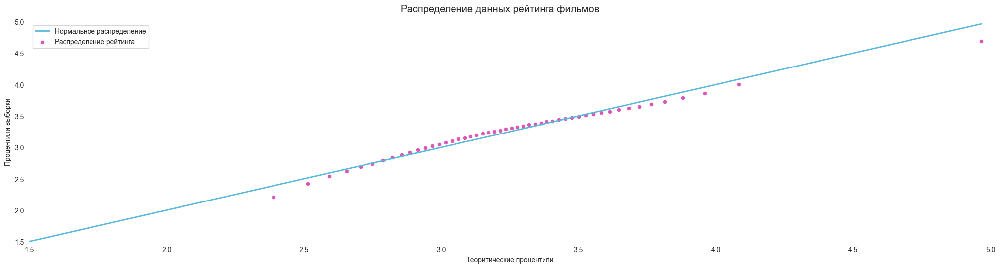

In [67]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Распределение данных рейтинга фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

rating_distribution = df['movies'].loc[df['movies']['rating'].notna(), 'rating']
normal_distribution = np.random.normal(
    loc=rating_distribution.mean(), 
    scale=rating_distribution.std(), 
    size=rating_distribution.size
)

percentiles = np.linspace(0, 100, 51)
rating = np.percentile(rating_distribution, percentiles)
normal = np.percentile(normal_distribution, percentiles)

sns.lineplot(
    x=normal, 
    y=normal,
    linewidth=2.0,
    ax=figure.axes[0], 
    label='Нормальное распределение', 
    color=sns.color_palette('hls', 15)[8]
)

sns.scatterplot(
    x=normal,
    y=rating,
    sizes=8,
    ax=figure.axes[0], 
    label='Распределение рейтинга', 
    color=sns.color_palette('hls', 15)[13]
)

figure.axes[0].set_xlabel('Теоритические процентили')
figure.axes[0].set_ylabel('Процентили выборки')
figure.axes[0].set_xbound((1.5, 5.0))
figure.axes[0].set_ybound((1.5, 5.0))
figure.axes[0].set_xticks(np.linspace(1.5, 5.0, 8))
figure.axes[0].set_yticks(np.linspace(1.5, 5.0, 8))
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].legend(alignment='left');

Распределение рейтинга фильмов (очень близко к **нормальному**.

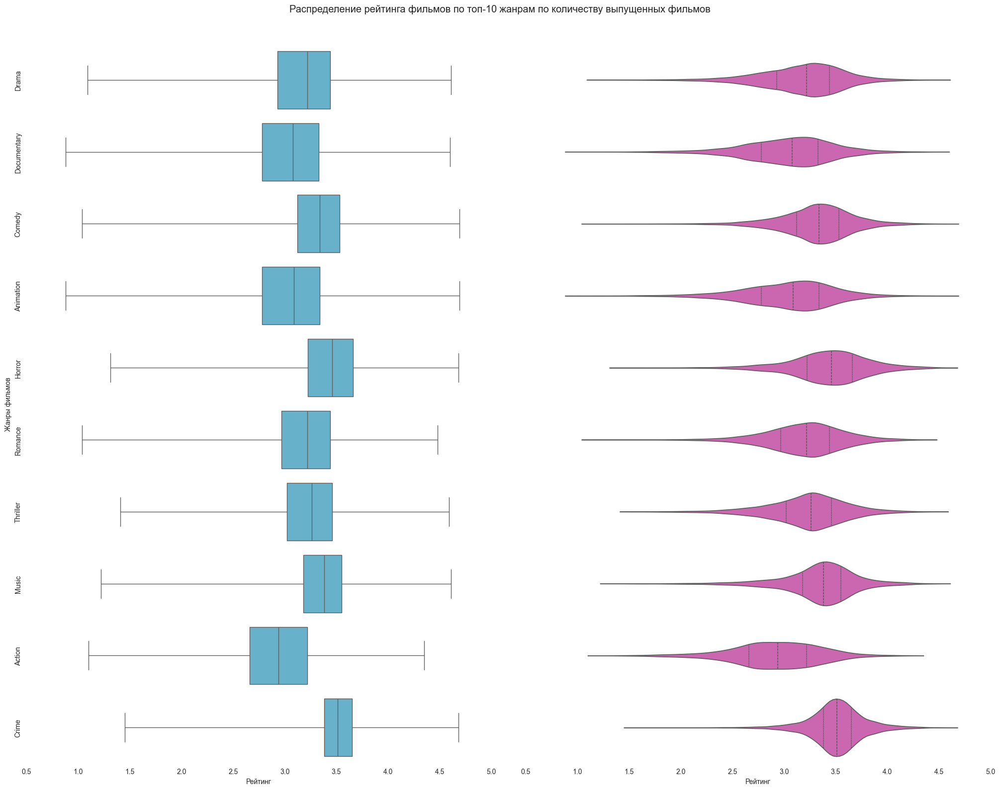

In [68]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 15)
)

figure.suptitle(
    t=('Распределение рейтинга фильмов '
       'по топ-10 жанрам по количеству выпущенных фильмов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

genres = (df['genres']['genre']
          .value_counts()
          .iloc[:10])

plot_data = (df['genres']
             .join(df['movies'][['id', 'rating']].set_index('id'), on='id'))
plot_data = (plot_data
             .loc[plot_data['genre'].isin(genres.index), ['rating', 'genre']])

sns.boxplot(
    data=plot_data,
    x='rating',
    y='genre',
    whis=(0, 100),
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

sns.violinplot(
    data=plot_data,
    x='rating',
    y='genre',
    inner="quart",
    bw_adjust=1.0,
    cut=0.0,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[13]
)

for i in range(2):
    figure.axes[i].set_xlabel('Рейтинг')
    figure.axes[i].set_ylabel('Жанры фильмов' if not i else '')
    figure.axes[i].set_xbound((0.5, 5.0))
    figure.axes[i].set_xticks(np.linspace(0.5, 5.0, 10))
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

figure.axes[0].set_yticks(
    ticks=np.arange(10), 
    labels=genres.index.map(str),
    rotation=90,
    verticalalignment='center'
)
figure.axes[1].set_yticklabels([]);

**Жанр кинофильма влияет** (было рассмотренно топ-10 жанров по количеству выпущенных фильмов) на распределение рейтинга фильмов.

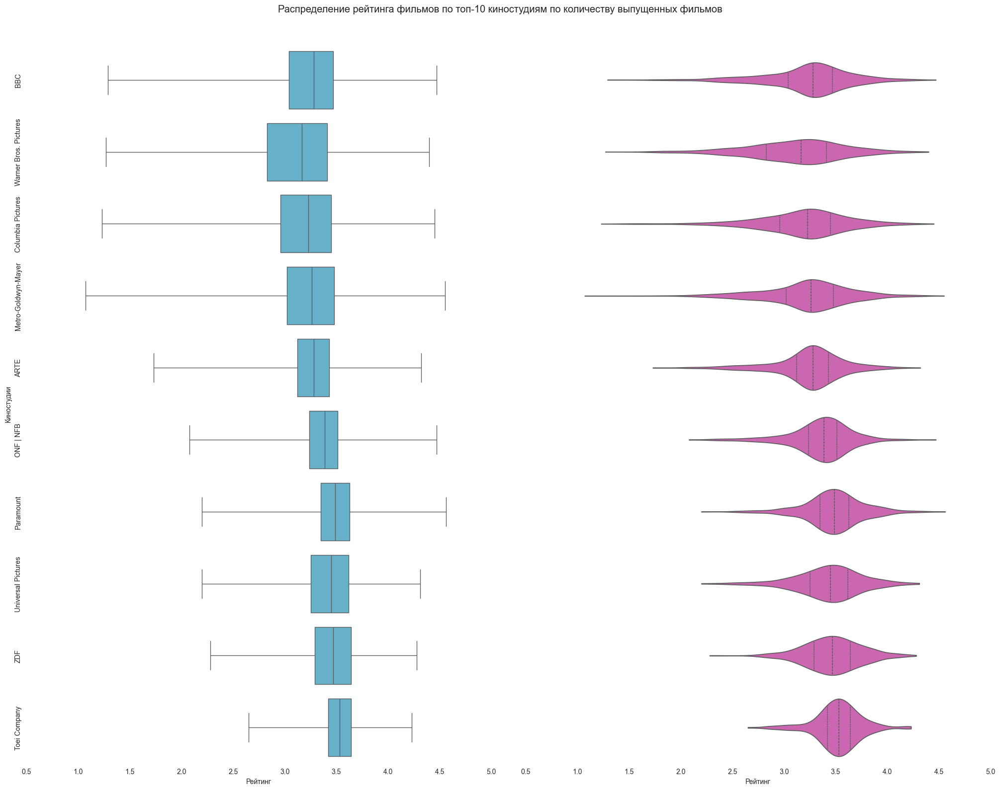

In [69]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 15)
)

figure.suptitle(
    t=('Распределение рейтинга фильмов '
       'по топ-10 киностудиям по количеству выпущенных фильмов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

studios = (df['studios']['studio']
          .value_counts()
          .iloc[:10])

plot_data = (df['studios']
             .join(df['movies'][['id', 'rating']].set_index('id'), on='id'))
plot_data = (plot_data
             .loc[plot_data['studio'].isin(studios.index), ['rating', 'studio']])

sns.boxplot(
    data=plot_data,
    x='rating',
    y='studio',
    whis=(0, 100),
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

sns.violinplot(
    data=plot_data,
    x='rating',
    y='studio',
    inner="quart",
    bw_adjust=1.0,
    cut=0.0,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[13]
)

for i in range(2):
    figure.axes[i].set_xlabel('Рейтинг')
    figure.axes[i].set_ylabel('Киностудии' if not i else '')
    figure.axes[i].set_xbound((0.5, 5.0))
    figure.axes[i].set_xticks(np.linspace(0.5, 5.0, 10))
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

figure.axes[0].set_yticks(
    ticks=np.arange(10), 
    labels=studios.index.map(str),
    rotation=90,
    verticalalignment='center'
)
figure.axes[1].set_yticklabels([]);

**Киностудия оказывает меньшее влияние** чем жанр (было рассмотренно топ-10 киностудий по количеству выпущенных фильмов) на распределение рейтинга фильмов.

## Анализ категориальных данных 

In [70]:
arrays = [[], []]
for name in df:
    columns = (df[name]
               .select_dtypes(include='object')).columns.to_list()
    arrays[0] += [name] * len(columns)
    arrays[1] += columns
columns = pd.MultiIndex.from_arrays(
    arrays=arrays,
    names=['Набор данных', 'Поля']
)

categories = pd.DataFrame(
    columns=columns,
    index=['count', 'unique', 'top', 'freq']
)

for name in df:
    values = (df[name]
             .select_dtypes(include='object')
             .describe())
    for column in values.columns:
        for index in categories.index:
            categories.loc[index, (name, column)] = values.loc[index, column]

categories

Набор данных     actors          countries      crew                  genres  \
Поля               name     role   country      role           name    genre   
count           5656098  4319355    680321   4635772        4635771  1027891   
unique          1589266  1854555       247        29        1136491       19   
top           Mel Blanc     Self       USA  Director  Louis Lumière    Drama   
freq               1058   182623    172333    879865           1175   225975   

Набор данных languages           movies                   \
Поля              type language    name          tagline   
count          1020123  1020123  925477           137273   
unique               3      192  785957           133713   
top           Language  English    Home  animation short   
freq            833790   467725     141              100   

Набор данных                       releases                     studios  \
Поля                   description  country        type  rating  studio   
count                       767916  1324620     1324620  332369  663307   
unique                      752154      246           6     283  159598   
top           Mexican feature film      USA  Theatrical      NR     BBC   
freq                           891   318889      745853   42108    3355   

Набор данных                  themes  
Поля                           theme  
count                         121070  
unique                           109  
top           Crude humor and satire  
freq                            3778

В наборе данных присутствует:
- более **240** стран выпустивших фильм;
- более **25** ролей в съемочной группе;
- **19** жанров;
- более **185** языков;
- более **240** стран, в которых проходили релизы фильмов;
- более **5** типов релизов;
- более **100** тем, на которые были сняты кинофильмы.

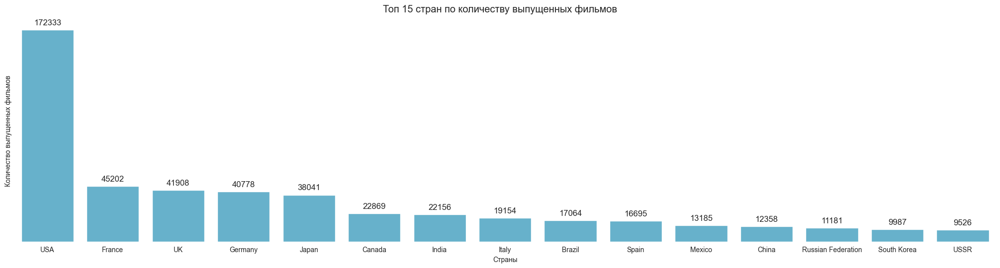

In [71]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 стран по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['countries']['country']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Страны')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольшее количество фильмов было выпущено в **USA** (более **140 тыс.** фильмов)

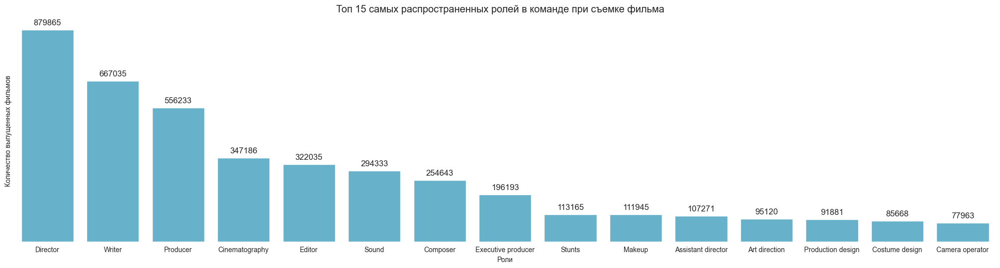

In [72]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 самых распространенных ролей в команде при съемке фильма', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['crew']['role']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Роли')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самая распространенная роль в съемочной группе - **Director**. Находился в съемочной группе при съемках более **845 тыс.** фильмов.

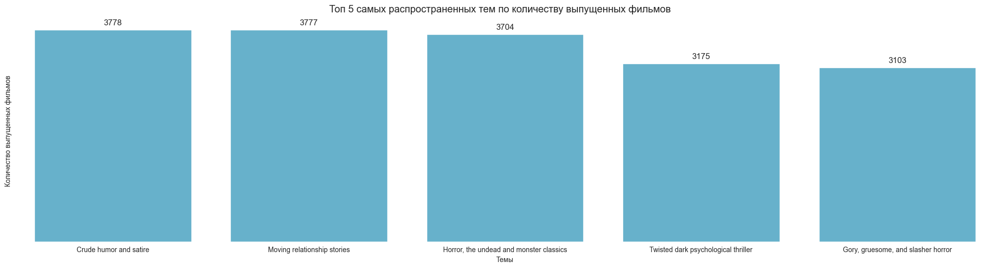

In [73]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 5 самых распространенных тем по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['themes']['theme']
             .value_counts()
             .iloc[:5])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Темы')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самой распространенной темой, на которую был снят фильм - **Horror, the undead and monster classics** (приблизительно **5000** фильмов)

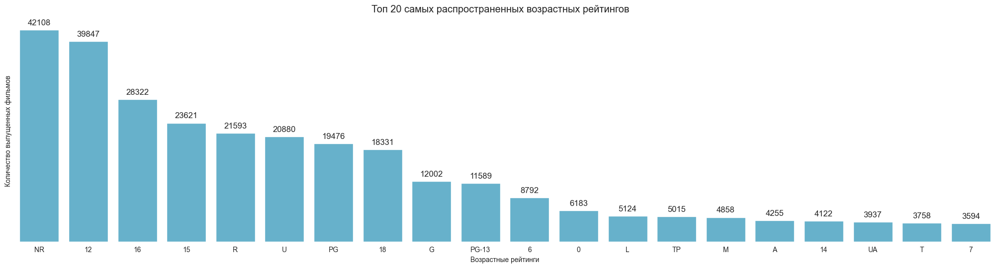

In [74]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 20 самых распространенных возрастных рейтингов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['releases']['rating']
             .value_counts()
             .iloc[:20])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Возрастные рейтинги')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный возрастной рейтинг (**за исключением NR** - более **40 тыс.** фильмов) - **R**. С данным рейтингом было выпущено более **20 тыс**. фильмов.

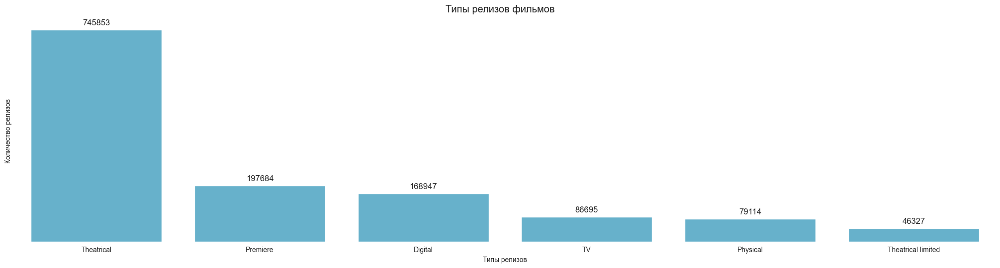

In [75]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Типы релизов фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['releases']['type']
             .value_counts())

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Типы релизов')
figure.axes[0].set_ylabel('Количество релизов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный тип релиза - **Theatrical** (более **720 тыс**. фильмов).

### Жанры фильмов

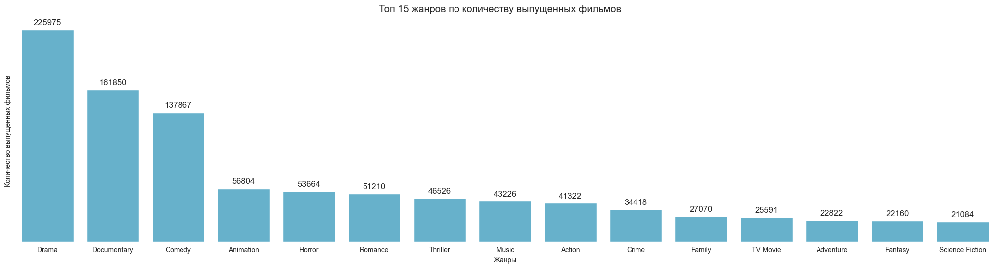

In [76]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 жанров по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['genres']['genre']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный жанр фильма - **Drama**. В данном жанры было снято более **215** тыс. фильмов.

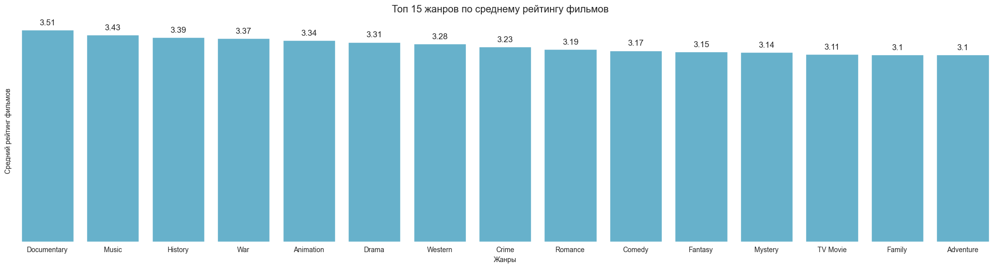

In [77]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 жанров по среднему рейтингу фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['genres']
             .join(df['movies'].set_index('id'), on='id')
             .groupby('genre')['rating']
             .mean()
             .sort_values(ascending=False)
             .round(2)
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Средний рейтинг фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольший средний рейтинг имеют фильмы в жанре **Documentary** (более **3.5**).

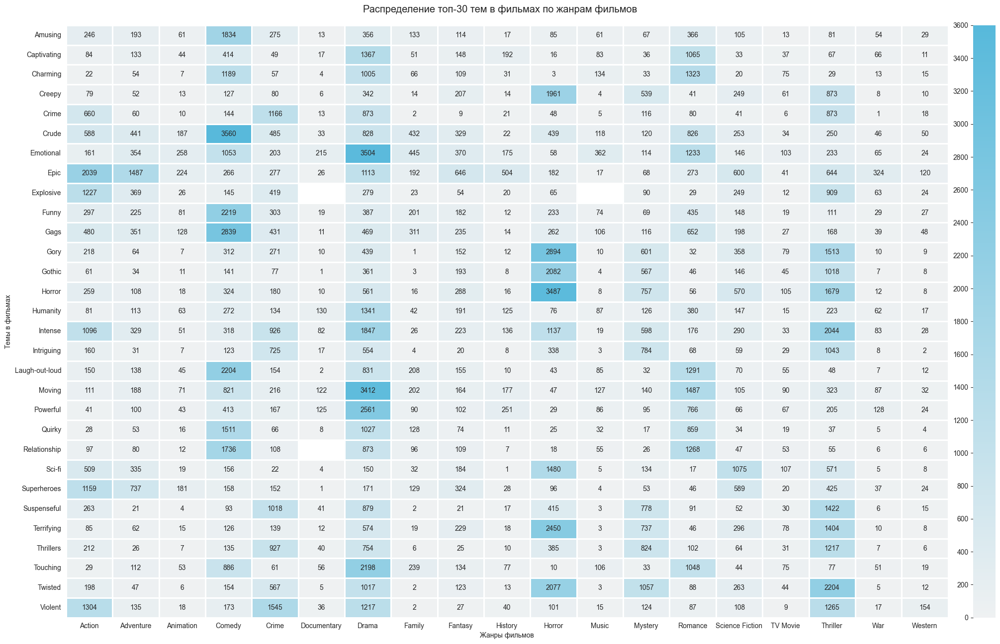

In [78]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 12.5)
)

figure.suptitle(
    t=('Распределение топ-30 тем в фильмах по жанрам фильмов'), 
    y=1.025, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.01,
    width_ratios=[1, 0.025]
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

plot_data = (df['genres']
             .join(df['themes'].set_index('id'), on='id')
             .dropna())
plot_data['theme'] = (plot_data['theme']
                      .apply(lambda x: x.replace(',', '').split()[0]))
plot_data = (plot_data[plot_data['theme']
             .isin(plot_data['theme'].value_counts().index[:30])])
plot_data = (plot_data
             .groupby('genre')['theme']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)



s, maximum = plot.step(plot_data.max().max())

sns.heatmap(
    data=plot_data,
    linewidths=1.0,
    cmap=sns.color_palette("light:#57b9db", as_cmap=True),
    ax=figure.axes[0],
    cbar_ax=figure.axes[1],
    cbar_kws={'ticklocation': 'left'},
    annot=True,
    fmt='d',
    mask=plot_data == 0,
    vmin=0,
    vmax=maximum
)

figure.axes[1].set_yticks(np.arange(0, maximum + 1, s))
figure.axes[0].set_xlabel('Жанры фильмов')
figure.axes[0].set_ylabel('Темы в фильмах');

### Киностудии

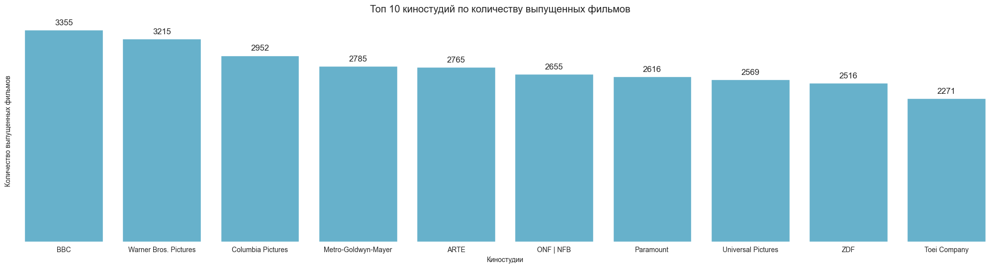

In [79]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 10 киностудий по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['studios']['studio']
             .value_counts()
             .iloc[:10])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Киностудии')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самая распространенная киностудия - **Warner Bros. Pictures**. Данной киностудией было снято более **3400** фильмов.

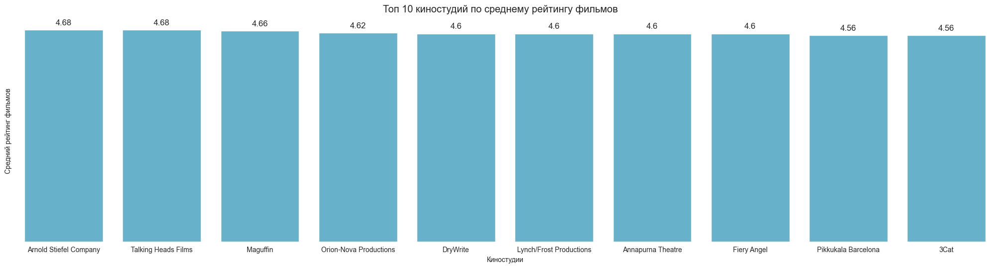

In [80]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 10 киностудий по среднему рейтингу фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['studios']
             .join(df['movies'].set_index('id'), on='id')
             .groupby('studio')['rating']
             .mean()
             .sort_values(ascending=False)
             .round(2)
             .iloc[:10])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Киностудии')
figure.axes[0].set_ylabel('Средний рейтинг фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольший средний рейтинг имеют кинофильмы, снятые киностудией **Arnold Stiefel Company** (более **4.65**).

## Американская киноассоциация

In [81]:
mask = ((df['releases']['country'] == 'USA') & 
        (df['releases']['type'] == 'Theatrical') &
        (df['releases']['date'] >= '2000-01-01'))

In [82]:
data = df['releases'].loc[mask, ['id', 'rating']]

In [83]:
def insert(index: int, genres: pd.Series, exclude: tuple = ()) -> list:
    if index in genres.index:
        value = genres[[index]].to_list()
        value = set(value) - set(exclude) 
        return sorted(value)
    else:
        return None

In [84]:
genres=df['genres'].set_index('id')['genre']

In [85]:
data['genres'] = data['id'].apply(insert, genres=genres)

In [86]:
data.isna().sum()

id            0
rating    61475
genres    22233
dtype: int64

In [87]:
data = data.dropna()

In [88]:
data.isna().sum()

id        0
rating    0
genres    0
dtype: int64

In [89]:
files = [*map(int, posters.str.split('.', expand=True)[0].to_list())]

In [90]:
data = data[data['id'].isin(files)]

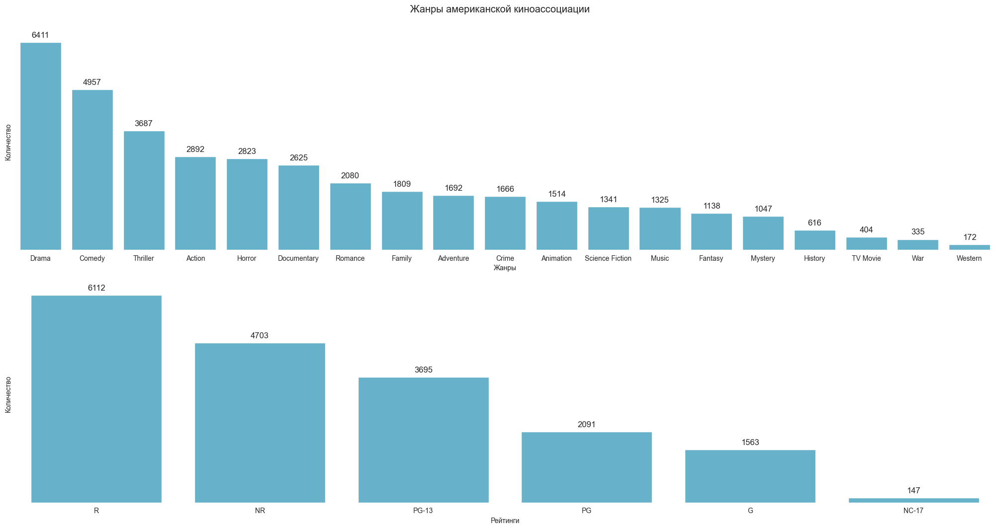

In [91]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 10)
)

figure.suptitle(
    t='Жанры американской киноассоциации', 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=2, 
    ncols=1, 
    hspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[1, 0])

plot_data = data['genres'].explode().value_counts()

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

plot_data = data['rating'].value_counts()

sns.barplot(
    data=plot_data,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Количество')
figure.axes[0].set_yticks([])

figure.axes[1].set_xlabel('Рейтинги')
figure.axes[1].set_ylabel('Количество')
figure.axes[1].set_yticks([])

for i in 0, 1:
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)
        
    figure.axes[i].bar_label(
        container=figure.axes[i].containers[0], 
        fontsize=12, 
        padding=5
    )

In [92]:
exclude=(
    'History',
    'TV Movie',
    'War',
    'Western'
)

In [93]:
data['genres'] = data['id'].apply(insert, genres=genres, exclude=exclude)

In [94]:
data = data[data['rating'] != 'NC-17']

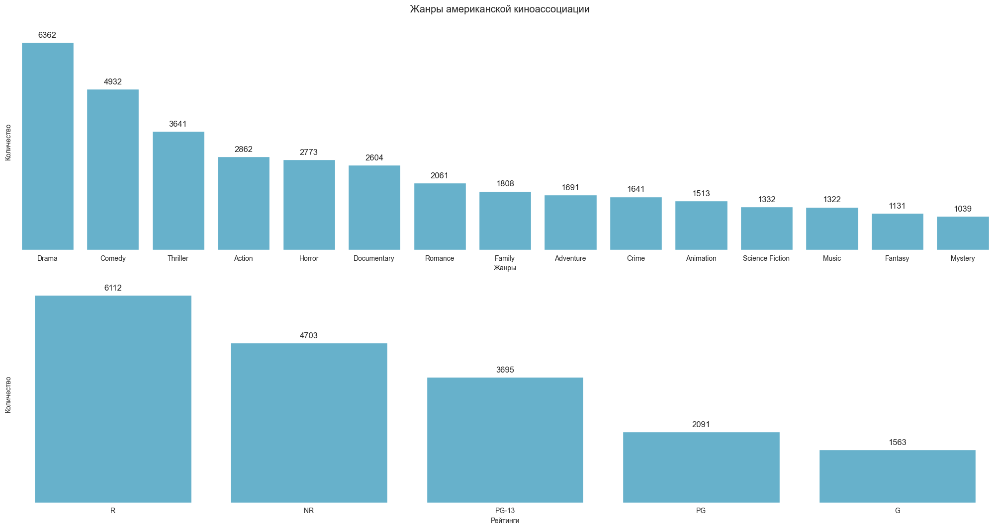

In [95]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 10)
)

figure.suptitle(
    t='Жанры американской киноассоциации', 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=2, 
    ncols=1, 
    hspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[1, 0])

plot_data = data['genres'].explode().value_counts()

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

plot_data = data['rating'].value_counts()

sns.barplot(
    data=plot_data,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Количество')
figure.axes[0].set_yticks([])

figure.axes[1].set_xlabel('Рейтинги')
figure.axes[1].set_ylabel('Количество')
figure.axes[1].set_yticks([])

for i in 0, 1:
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)
        
    figure.axes[i].bar_label(
        container=figure.axes[i].containers[0], 
        fontsize=12, 
        padding=5
    )

# Выводы

**Выводы по предварительной обработке данных**.
1. Названия полей оставлены **без изменений**.
2. Измены типы данных:
    - для поля **date** в наборах **movie** и **releases** изменен тип данных на **datetime**;
    - для **числовых полей**, уменьшена точность до **32 бит**.
3. Удалено до **5000** вных дубликатов. 

**Выводы по разведочному анализу данных**:
1. Дата выпуска фильмов:
    - **первый фильм** выпущен в **1874** году. **Резкий подъем** количества выпущенных фильмов начинается в **2000** году и достигает свого **пика** в **2021** году (приблизительно **38 тыс.** фильмов);
    - наибольшее количество релизов проходит в **Январе**, **1 числа**, в **пятницу**;
    - среднее количество актеров, снимавшихся в фильме достигло своего пика в **1940** году (более **15** актеров). С этого года среднее количество актеров, снимавшихся в фильме **снижается**. В **2023** году их количество составляет **менее 10**.
2. Анализ числовых данных:
    - **Логистика** (**Логистический арт-проект**) — экспериментальный художественный фильм, продолжительностью 51 420 минут (857 часов или 35 дней и 17 часов). Это самый длинный фильм, когда-либо созданный;
    - более **90%** фильмов имеют продолжительность менее **115 минут** и рейтинг менее **3.7**;
    - между рейтингом и продолжительностью кинофильма **отсутствует линейная зависимость**. Коэффициент корреляции Пирсона - **0.08**.
    1. Анализ рейтинга фильмов:
        - распределение рейтинга фильмов (очень близко к **нормальному**;
        - **жанр кинофильма влияет** (было рассмотренно топ-10 жанров по количеству выпущенных фильмов) на распределение рейтинга фильмов;
        - **киностудия оказывает меньшее влияние** чем жанр (было рассмотренно топ-10 киностудий по количеству выпущенных фильмов) на распределение рейтинга фильмов.
2. Анализ категориальных данных:
    - в наборе данных присутствует:
        - более **240** стран выпустивших фильм;
        - более **25** ролей в съемочной группе;
        - **19** жанров;
        - более **185** языков;
        - более **240** стран, в которых проходили релизы фильмов;
        - более **5** типов релизов;
        - более **100** тем, на которые были сняты кинофильмы.
    - наибольшее количество фильмов было выпущено в **USA** (более **140 тыс.** фильмов);
    - самая распространенная роль в съемочной группе - **Director**. Находился в съемочной группе при съемках более **845 тыс.** фильмов;
    - самой распространенной темой, на которую был снят фильм - **Horror, the undead and monster classics** (более **5000** фильмов);
    - самый распространенный возрастной рейтинг (**за исключением NR** - более **40 тыс.** фильмов) - **R**. С данным рейтингом было выпущено более **20 тыс**. фильмов;
    - самый распространенный тип релиза - **Theatrical** (более **720 тыс**. фильмов).
    1. Жанры фильмов:
        - самый распространенный жанр фильма - **Drama**. В данном жанры было снято более **215** тыс. фильмов;
        - наибольший средний рейтинг имеют фильмы в жанре **Documentary** (более **3.5**).
    2. Киностудии:
        - самая распространенная киностудия - **Warner Bros. Pictures**. Данной киностудией было снято более **3400** фильмов;
        - наибольший средний рейтинг имеют кинофильмы, снятые киностудией **Arnold Stiefel Company** (более **4.65**).